In [3]:
import glob
import os
import h5py
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 200 # User can set this outside the class if needed

from astropy.io import fits
from astropy.io.votable import parse_single_table
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales
from astropy.coordinates import SkyCoord
import astropy.units as u

import os
import h5py
from tqdm import tqdm
from multiprocessing import Pool 
from concurrent.futures import ProcessPoolExecutor, as_completed, ThreadPoolExecutor
import numpy as np

from astropy.io import fits
from astropy.wcs import WCS
from astropy.wcs.utils import proj_plane_pixel_scales
import astropy.units as u
from astropy.table import Table

from reproject import reproject_interp
from reproject import reproject_exact
from reproject import reproject_adaptive

from scipy.sparse import coo_matrix
from scipy.sparse.linalg import lsqr
import sys 
import gc 
from functools import partial
from IPython.display import clear_output

from SelfCal.MapHelper import bit_to_bool, make_weight, find_outliers, map_pixels
from SelfCal.WCSHelper import load_from_fits, save_to_fits, find_optimal_frame
from SelfCal import MakeMap
from SelfCal.SPHERExUtility import make_fiducial_chunk_map, make_fiducial_chunk_mask, interpolate_array, load_calibration, interp_2d_vertical, interp_1d
import importlib
importlib.reload(MakeMap)

from datetime import datetime
import pandas as pd


In [ ]:
run_dir = '/mnt/md124/thomasli/selfcal/outputs/nep_det4_6p2arcsec/'

mapname = 'mosaic_34channels_D4_PAH_subchannel225-235_unnormoffsets_noweight'
# mapname = 'mosaic_34channels_D4_Ch24_unnormoffsets_widecal'
aliph_path = os.path.join(run_dir, 'mosaic', mapname + '.fits')
wcs = WCS(fits.open(aliph_path)[5].header)
aliph_map = fits.open(aliph_path)[5].data
aliph_mask = fits.open(aliph_path)[6].data > 0

chunk_valid_mask = np.zeros(342)
chunk_valid_mask[224:237] = 1

aliph_cal_path = os.path.join(run_dir, 'calibration', mapname.replace('mosaic', 'cal') + '.h5')
with h5py.File(aliph_cal_path, 'r') as file:
    cal_offsets = file['O'][()]
mean_offsets = np.mean(cal_offsets[:,chunk_valid_mask.astype(bool)])
aliph_map[aliph_mask] += mean_offsets


In [7]:
def plot_map(map, wcs=None, lowp=0.1, highp=95, fig=None, ax=None, colorbar=True, low=None, high=None, cmap='viridis', norm=LogNorm,
            cbar_label='MJy/sr'):
    if low is None or high is None:
        high, low = np.nanpercentile(map[map>0], [highp, lowp])
    if fig is None:
        fig = plt.figure(figsize=(10, 10))
    if ax is None:
        ax = fig.add_subplot(111, projection=wcs)
    if norm is LogNorm:
        im = ax.imshow(map, norm=LogNorm(vmin=low, vmax=high), origin='lower', cmap=cmap)
    else:
        im = ax.imshow(map, vmin=low, vmax=high, origin='lower', cmap=cmap)

    if wcs is not None:
        # Explicitly set axis labels
        ax.coords['ra'].set_axislabel('RA')
        ax.coords['ra'].set_axislabel_position('b')  # Ensure RA label is only at the bottom
        ax.coords['ra'].set_ticks_position('b')  # Set RA ticks only at the bottom
        ax.coords['ra'].set_ticklabel_position('b')  # Set RA tick labels only at the bottom
        ax.coords['dec'].set_axislabel('DEC')
        ax.grid(color='black', linestyle='--', alpha=0.5)

    if colorbar:
        cbar = plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.040, pad=0.04)
        cbar.set_label(cbar_label)
    return fig, ax

(<Figure size 2000x2000 with 2 Axes>, <WCSAxes: >)

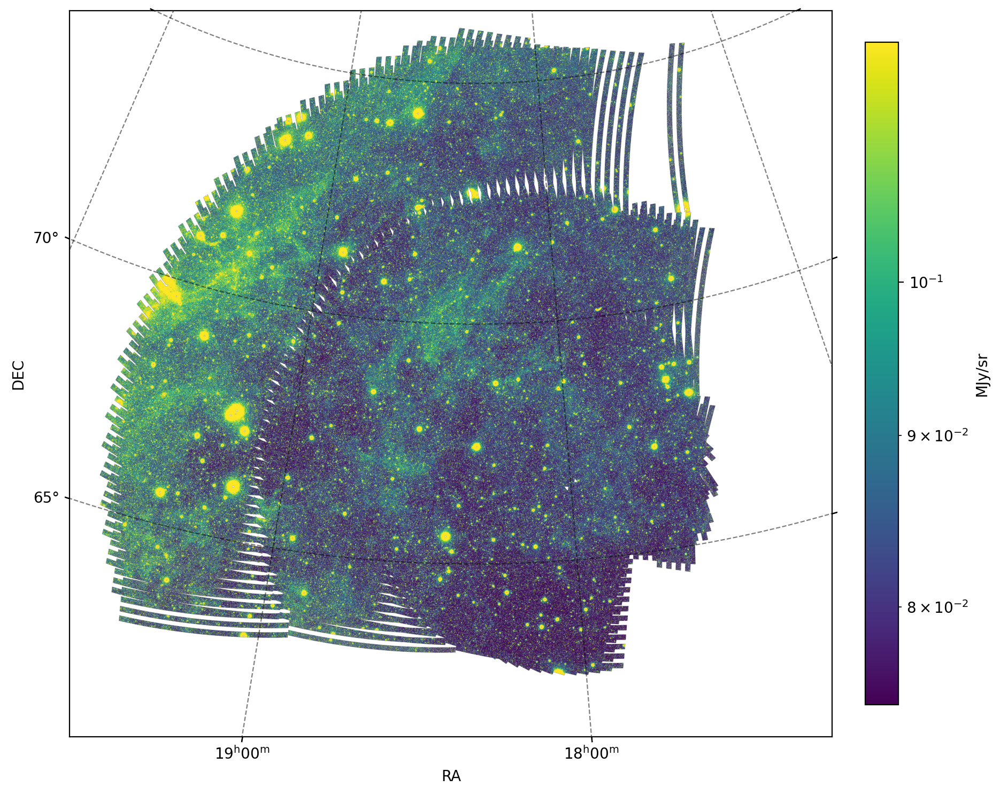

In [10]:
plot_map(aliph_map, wcs=wcs, lowp=5, highp=90, cmap='viridis', norm=LogNorm)

In [89]:
def extract_map(ch):
    mapname = f'mosaic_34channels_D4_Ch{ch}_unnormoffsets_noweight'
    cont_path = os.path.join(run_dir, 'mosaic', mapname + '.fits')
    cont_map = fits.open(cont_path)[5].data
    cont_mask = fits.open(cont_path)[6].data > 0
    cont_cal_path = os.path.join(run_dir, 'calibration', mapname.replace('mosaic', 'cal') + '.h5')
    with h5py.File(cont_cal_path, 'r') as file:
        cal_offset = file['O'][()]
    chunk_valid_mask = make_fiducial_chunk_mask([ch], num_channels=34, num_subchannels=10, padding=1)
    mean_offset = np.mean(cal_offset[:,chunk_valid_mask.astype(bool)])
    cont_map[cont_mask] += mean_offset
    return cont_map, cont_mask

In [90]:
extracted_maps = {}
for ch in tqdm([20, 27]):
    cont_map, cont_mask = extract_map(ch)
    extracted_maps[ch] = (cont_map, cont_mask)

100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:00<00:00,  2.42it/s]


In [99]:
print(np.nanpercentile(aliph_map[aliph_mask], [1, 50, 99]))

for ch in [20, 27]:
    print(np.nanpercentile(extracted_maps[ch][0][extracted_maps[ch][1]], [1, 50, 99]))

[0.07120875 0.08564288 0.52007911]
[0.06503245 0.07633933 0.52611982]
[0.07090059 0.08258073 0.48781313]


In [92]:
def plot_map(map, wcs=None, lowp=0.1, highp=95, fig=None, ax=None, colorbar=True, low=None, high=None, cmap='viridis', norm=LogNorm,
            cbar_label='MJy/sr'):
    if low is None or high is None:
        high, low = np.nanpercentile(map[map>0], [highp, lowp])
    if fig is None:
        fig = plt.figure(figsize=(10, 10))
    if ax is None:
        ax = fig.add_subplot(111, projection=wcs)
    if norm is LogNorm:
        im = ax.imshow(map, norm=LogNorm(vmin=low, vmax=high), origin='lower', cmap=cmap)
    else:
        im = ax.imshow(map, vmin=low, vmax=high, origin='lower', cmap=cmap)

    if wcs is not None:
        # Explicitly set axis labels
        ax.coords['ra'].set_axislabel('RA')
        ax.coords['ra'].set_axislabel_position('b')  # Ensure RA label is only at the bottom
        ax.coords['ra'].set_ticks_position('b')  # Set RA ticks only at the bottom
        ax.coords['ra'].set_ticklabel_position('b')  # Set RA tick labels only at the bottom
        ax.coords['dec'].set_axislabel('DEC')
        ax.grid(color='black', linestyle='--', alpha=0.5)

    if colorbar:
        cbar = plt.colorbar(im, ax=ax, orientation='vertical', fraction=0.040, pad=0.04)
        cbar.set_label(cbar_label)
    return fig, ax

In [104]:
interp_map = (extracted_maps[20][0] + extracted_maps[27][0])/2
pah_map = aliph_map - interp_map

pah_mask = (aliph_mask) & (extracted_maps[20][1]) & (extracted_maps[27][1])
pah_map[~pah_mask] = np.nan

In [94]:
# plt.imshow(fits.open(aliph_path)[6].data[2000:5000,1000:4000])
# plt.colorbar()

(<Figure size 2000x2000 with 2 Axes>, <Axes: >)

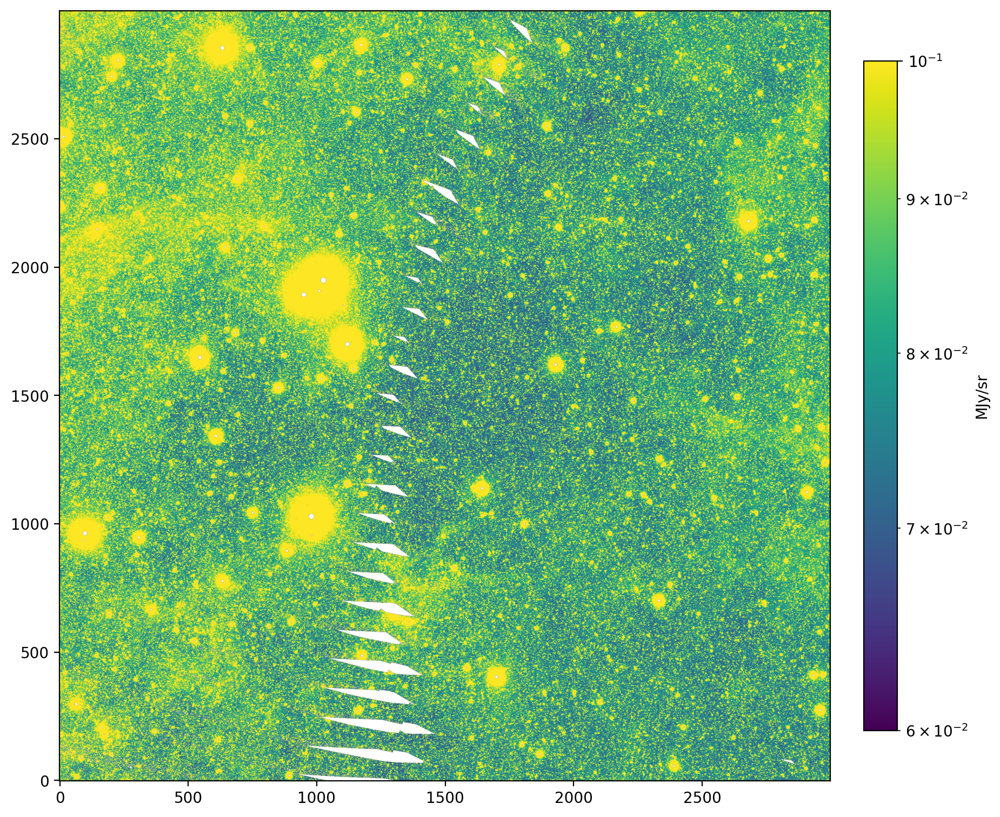

In [96]:
plot_map(aliph_map[2000:5000,1000:4000], low=0.06, high=0.1, colorbar=True)

(<Figure size 2000x2000 with 2 Axes>, <Axes: >)

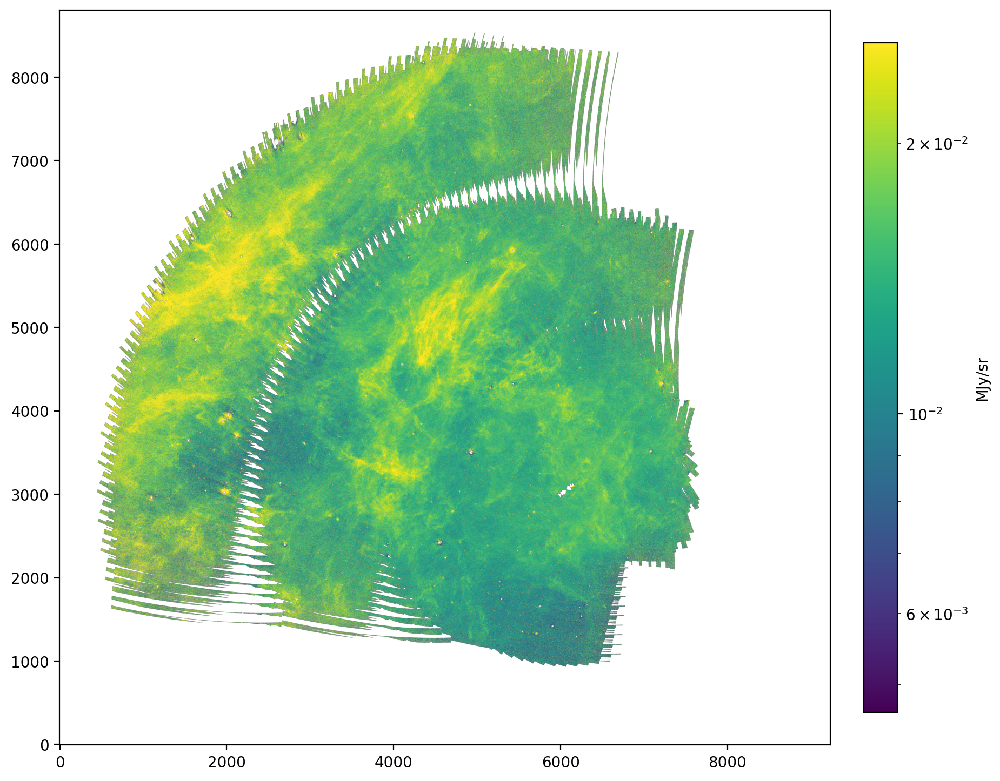

In [106]:
plot_map(pah_map+0.01, lowp=1, highp=95, colorbar=True)